In [1]:
import time

import pandas as pd  
import numpy as np

from torch.autograd import Variable
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split, SubsetRandomSampler, WeightedRandomSampler
import torch.utils.data as data_utils

from skorch import NeuralNetClassifier, NeuralNet, NeuralNetBinaryClassifier
from skorch.callbacks import EarlyStopping, ProgressBar, Checkpoint, TrainEndCheckpoint, LoadInitState

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns 
from pylab import rcParams
import cufflinks as cf

from sklearn.metrics import (confusion_matrix, precision_recall_curve, auc,
                             roc_curve, recall_score, classification_report, f1_score,
                             precision_recall_fscore_support)

import shap
import lime
from lime import submodular_pick

sns.set(style='whitegrid', palette='muted', font_scale=1.5)

plt.rcParams['figure.figsize'] = 14, 8

RANDOM_SEED = 42
LABELS = ["N", "Y"]

/Users/wbchoi/anaconda3/lib/python3.7/site-packages/dask/config.py:168: YAMLLoadWarning:

calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.



In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
## train data
class trainData(Dataset):
    
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data
        
    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]
        
    def __len__ (self):
        return len(self.X_data)

In [4]:
## test data    
class testData(Dataset):
    
    def __init__(self, X_data):
        self.X_data = X_data
        
    def __getitem__(self, index):
        return self.X_data[index]
        
    def __len__ (self):
        return len(self.X_data)

In [5]:
df = pd.read_csv('/Users/wbchoi/PycharmProjects/ai_projects/C_ITS/prediction_modeling/full_data_kma_hours_lightgbm_feature_extract.csv')

In [6]:
X = df.iloc[:, 0:-1]
y = df.iloc[:, -1]

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)

In [8]:
y_train_create = pd.DataFrame(y_train)

In [9]:
y_train_create.columns = ['SAGO_YN']
sago_x_weight = y_train_create[y_train_create['SAGO_YN'] == 0]
sago_y_weight = y_train_create[y_train_create['SAGO_YN'] == 1]

In [10]:
len(sago_y_weight)

3006

In [11]:
weight_ratio = len(sago_x_weight) / len(sago_y_weight)
weight_ratio = round(weight_ratio, 1)
weight_ratio

4203.3

In [12]:
cross_entropy_x = len(sago_x_weight) / len(y_train)
cross_entropy_x

0.9997621478476635

In [13]:
cross_entropy_y = len(sago_y_weight) / len(y_train)
cross_entropy_y

0.0002378521523364701

In [14]:
num_epochs = 20
batch_size = 1024

lr = 10e-5 # AdamW 일 때, default = 0.001
# weight_decay = 10e-05
# weight_decay = 10e-03 # AdamW 일 때, default = 0.01
weight_decay = 10e-4

In [15]:
train_data = trainData(torch.FloatTensor(X_train.values), 
                       torch.FloatTensor(y_train.values))

test_data = testData(torch.FloatTensor(X_test.values))

In [16]:
train_loader = DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(dataset=test_data, batch_size=1)

In [17]:
X_train.shape[1]

36

In [18]:
# Model definition
model = nn.Sequential(nn.Linear(X_train.shape[1], 64),
                      nn.ReLU(),
                      nn.BatchNorm1d(64),
                      
                      nn.Linear(64, 64),
                      nn.ReLU(),
                      nn.Dropout(p=0.2),
                      nn.BatchNorm1d(64),
                      
                      nn.Linear(64, 64),
                      nn.ReLU(),
                      nn.Dropout(p=0.2),
                      nn.BatchNorm1d(64),
                      
                      nn.Linear(64, 64),
                      nn.ReLU(),
                      nn.Dropout(p=0.2),
                      nn.BatchNorm1d(64),
                      
                      nn.Linear(64, 1)                      
                     )

In [19]:
'''BCEWithLogitsLoss 가중치 샘플링, output neuron = 1''' 
class_weight = torch.FloatTensor([weight_ratio]).double()

'''CrossEntropyLoss, NLLLoss 가중치 샘플링, output neuron = 2'''
# class_weight = torch.FloatTensor([1.0 / weight_ratio, 1.0]).double()

print(class_weight)
print(class_weight.dtype)

tensor([4203.2998], dtype=torch.float64)
torch.float64


In [20]:
criterion = nn.BCEWithLogitsLoss
# criterion = nn.CrossEntropyLoss

# optimizer = optim.Adam
optimizer = optim.AdamW # AdamW : Adam + weight_decay

In [21]:
# Number of trainable parameters
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(count_parameters(model))

15425


In [22]:
es = EarlyStopping()
pbar = ProgressBar
cp = Checkpoint(dirname='pytorch_DNN_model')
train_end_cp = TrainEndCheckpoint(dirname='pytorch_DNN_model')

In [23]:
net = NeuralNetBinaryClassifier(
    model.double(),
    criterion=criterion,
    criterion__pos_weight=class_weight,
    # criterion__weight=class_weight,
    
    criterion__reduction='mean',
    optimizer=optimizer,
    optimizer__lr=lr,
    optimizer__weight_decay=weight_decay,
    max_epochs=num_epochs,
    batch_size=batch_size,
    lr=lr,
    callbacks=[es, pbar, cp, train_end_cp]
)

In [25]:
# net.fit(X_train.values.astype(np.float64), y_train.values.astype(np.float64))

  epoch    train_loss    valid_acc    valid_loss    cp       dur
-------  ------------  -----------  ------------  ----  --------
      1        1.1692       0.6627        1.0943     +  338.5891


      2        1.1033       0.7094        1.0808     +  335.5998


      3        1.0820       0.7573        1.0832        318.4630


      4        1.0728       0.7466        1.0715     +  313.7384


      5        1.0646       0.7260        1.0724        314.1318


      6        1.0614       0.7331        1.0719        322.3152


      7        1.0568       0.7378        1.0673     +  323.8485


      8        1.0500       0.7395        1.0626     +  315.2430


      9        1.0433       0.7210        1.0637        301.0254


     10        1.0440       0.7356        1.0537     +  290.4956


     11        1.0399       0.7274        1.0553        289.5359


     12        1.0335       0.7375        1.0483     +  289.5491


     13        1.0318       0.7312        1.0473     +  289.5038


     14        1.0238       0.7426        1.0490        289.1392


     15        1.0246       0.7489        1.0428     +  289.4046


     16        1.0260       0.7516        1.0461        289.8226


     17        1.0222       0.7304        1.0369     +  289.7569


     18        1.0231       0.7676        1.0409        289.5399


     19        1.0139       0.7631        1.0413        290.1454


     20        1.0113       0.7189        1.0315     +  299.8253


<class 'skorch.classifier.NeuralNetBinaryClassifier'>[initialized](
  module_=Sequential(
    (0): Linear(in_features=36, out_features=64, bias=True)
    (1): ReLU()
    (2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Linear(in_features=64, out_features=64, bias=True)
    (4): ReLU()
    (5): Dropout(p=0.2, inplace=False)
    (6): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): Linear(in_features=64, out_features=64, bias=True)
    (8): ReLU()
    (9): Dropout(p=0.2, inplace=False)
    (10): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): Linear(in_features=64, out_features=64, bias=True)
    (12): ReLU()
    (13): Dropout(p=0.2, inplace=False)
    (14): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (15): Linear(in_features=64, out_features=1, bias=True)
  ),
)

In [26]:
# net.save_params(
#   f_params='pytorch_DNN_model/model_epoch_20.pkl', f_optimizer='pytorch_DNN_model/opt_epoch_20.pkl', 
#   f_history='pytorch_DNN_model/history_epoch_20.json')

In [24]:
net.initialize()  # This is important!
net.load_params(f_params='pytorch_DNN_model/model_epoch_20.pkl', f_optimizer='pytorch_DNN_model/opt_epoch_20.pkl', 
   f_history='pytorch_DNN_model/history_epoch_20.json')

In [25]:
load_state = LoadInitState(cp)

In [26]:
net = NeuralNetBinaryClassifier(
    model.double(),
    criterion=criterion,
    criterion__pos_weight=class_weight,
    # criterion__weight=class_weight,
    
    criterion__reduction='mean',
    optimizer=optimizer,
    optimizer__lr=lr,
    optimizer__weight_decay=weight_decay,
    max_epochs=num_epochs,
    batch_size=batch_size,
    lr=lr,
    callbacks=[es, pbar, cp, load_state]
)

In [27]:
net.fit(X_train.values.astype(np.float64), y_train.values.astype(np.float64))

  epoch    train_loss    valid_acc    valid_loss    cp       dur
-------  ------------  -----------  ------------  ----  --------
     31        0.9972       0.7507        1.0277     +  298.1075


     32        0.9926       0.7803        1.0354        292.9727


     33        0.9887       0.7753        1.0389        292.1455


     34        0.9950       0.7745        1.0421        291.9530


     35        0.9922       0.7663        1.0376        292.7106


Stopping since valid_loss has not improved in the last 5 epochs.


<class 'skorch.classifier.NeuralNetBinaryClassifier'>[initialized](
  module_=Sequential(
    (0): Linear(in_features=36, out_features=64, bias=True)
    (1): ReLU()
    (2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Linear(in_features=64, out_features=64, bias=True)
    (4): ReLU()
    (5): Dropout(p=0.2, inplace=False)
    (6): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): Linear(in_features=64, out_features=64, bias=True)
    (8): ReLU()
    (9): Dropout(p=0.2, inplace=False)
    (10): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): Linear(in_features=64, out_features=64, bias=True)
    (12): ReLU()
    (13): Dropout(p=0.2, inplace=False)
    (14): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (15): Linear(in_features=64, out_features=1, bias=True)
  ),
)

In [28]:
1 + 1

2

In [29]:
# net.save_params(
#   f_params='pytorch_DNN_model/model_epoch_40.pkl', f_optimizer='pytorch_DNN_model/opt_epoch_40.pkl', 
#   f_history='pytorch_DNN_model/history_epoch_40.json')

In [30]:
net.initialize()  # This is important!
net.load_params(f_params='pytorch_DNN_model/model_epoch_40.pkl', f_optimizer='pytorch_DNN_model/opt_epoch_40.pkl', 
   f_history='pytorch_DNN_model/history_epoch_40.json')

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.


In [31]:
1 + 1

2

In [32]:
# Predict
preds = net.predict(X_test.values.astype(np.float64))
preds

array([0, 1, 1, ..., 0, 1, 0], dtype=uint8)

In [33]:
net.predict_proba

<bound method NeuralNetBinaryClassifier.predict_proba of <class 'skorch.classifier.NeuralNetBinaryClassifier'>[initialized](
  module_=Sequential(
    (0): Linear(in_features=36, out_features=64, bias=True)
    (1): ReLU()
    (2): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Linear(in_features=64, out_features=64, bias=True)
    (4): ReLU()
    (5): Dropout(p=0.2, inplace=False)
    (6): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): Linear(in_features=64, out_features=64, bias=True)
    (8): ReLU()
    (9): Dropout(p=0.2, inplace=False)
    (10): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): Linear(in_features=64, out_features=64, bias=True)
    (12): ReLU()
    (13): Dropout(p=0.2, inplace=False)
    (14): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (15): Linear(in_features=64, out_features=1, bias=True)
  ),
)>

In [34]:
cm = confusion_matrix(y_test, preds)
print(cm)

[[2430818  727963]
 [    221     524]]


In [35]:
print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       1.00      0.77      0.87   3158781
           1       0.00      0.70      0.00       745

    accuracy                           0.77   3159526
   macro avg       0.50      0.74      0.44   3159526
weighted avg       1.00      0.77      0.87   3159526



In [36]:
tp = cm[1,1]
tn = cm[0,0]
fp = cm[0,1]
fn = cm[1,0]

acc = (tp + tn) / (tp + tn + fp + fn)
prec = tp / (tp+fp)
rec = tp / (tp+fn)
spec = tn / (fp + tn)

print('정확도 (Accuracy): %f , 정밀도 (Precision): %f , 재현율 (Recall): %f , 특이도 (Specificity): %f' % (acc, prec, rec, spec))

정확도 (Accuracy): 0.769527 , 정밀도 (Precision): 0.000719 , 재현율 (Recall): 0.703356 , 특이도 (Specificity): 0.769543


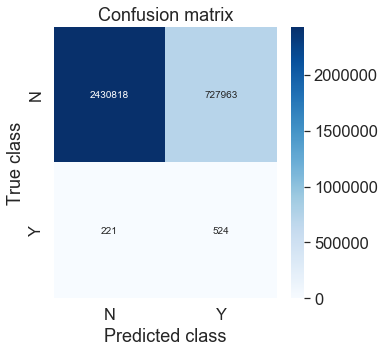

In [37]:
plt.figure(figsize=(5,5))
sns.heatmap(cm, xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d", 
            cmap=plt.cm.get_cmap('Blues'));
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

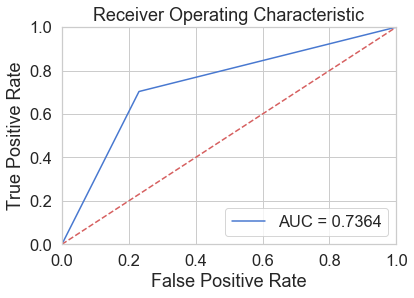

In [38]:
fpr, tpr, thresholds = roc_curve(y_test, preds)
roc_auc = auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, label='AUC = %0.4f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.001, 1])
plt.ylim([0, 1.001])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

# Deep Explainer

In [53]:
X_train_np = X_train.values
X_test_np = X_test.values

train_data_samples = torch.from_numpy(X_train_np[np.random.choice(np.arange(len(X_train)), 10000, replace = False)]).to(device)
test_data_samples = torch.from_numpy(X_test_np[np.random.choice(np.arange(len(X_test)), 500, replace = False)]).to(device)

In [54]:
X_train_10000 = X_train.sample(10000)
X_test_500 = X_test.sample(500)

In [57]:
'''
X_test 전체 데이터 아닌 500개 랜덤 추출 데이터셋 사용.
shape values 추출을 위해 시간 오래 걸림
'''
explainer_shap = shap.DeepExplainer(model.double(), train_data_samples)

start = time.time()
shap_values = explainer_shap.shap_values(test_data_samples) 
end = time.time()

shap_time = end - start 
print('shap values 추출 소요 시간 : %.3f' %(shap_time))

# 5000개 랜덤 추출 시간: 약 39분
# 10000개 랜덤 추출 시간: 약 2시간 10분 이상 소요 (강제 중단)

shap values 추출 소요 시간 : 552.062


In [58]:
df = pd.DataFrame({
    "mean_abs_shap": np.mean(np.abs(shap_values), axis=0), 
    "stdev_abs_shap": np.std(np.abs(shap_values), axis=0), 
    "name": X_test.columns
})

df.sort_values("mean_abs_shap", ascending=False)[:20]

,mean_abs_shap,stdev_abs_shap,name
7,0.422080,0.142356,A3_ROADTYPE_1_YN
4,0.420928,0.346523,LANES
8,0.222442,0.212221,A1_LANE_04_YN
3,0.217760,0.297606,MAX_SPD
20,0.161119,0.116756,BUS_CNT
35,0.134120,0.116634,HM
1,0.112016,0.233335,ROAD_TYPE
33,0.103905,0.091848,TEMP
19,0.095337,0.091694,CW_CNT
17,0.092048,0.096728,NODE_LANES_CNT


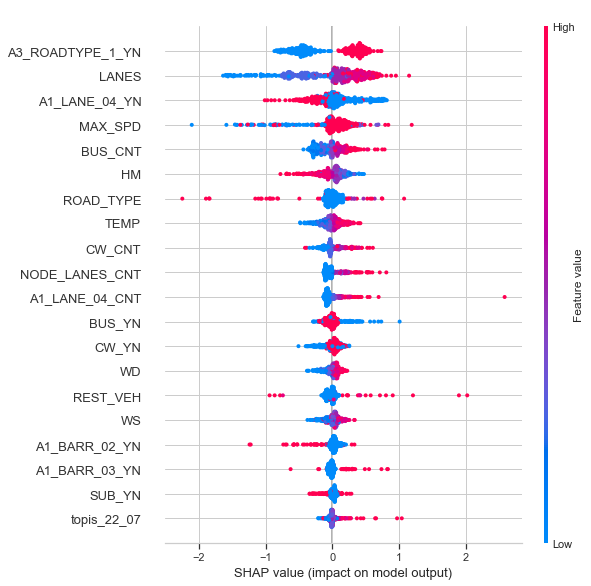

In [59]:
shap.summary_plot(shap_values, features=test_data_samples, feature_names=X_test.columns)

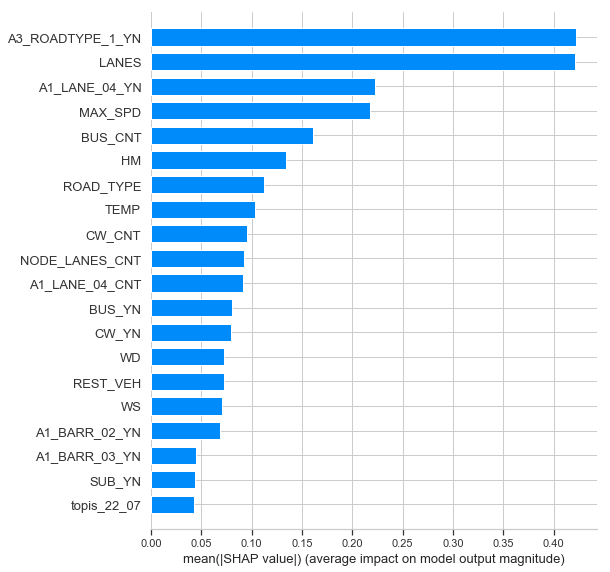

In [60]:
shap.summary_plot(shap_values, features=test_data_samples, feature_names=X_test.columns, plot_type="bar")

In [63]:
shap.initjs()
shap.force_plot(explainer_shap.expected_value, shap_values[0,:], X_test_500.iloc[0,:])

# shap.force_plot(explainer_shap.expected_value,
#                shap_values,
#                feature_names=X_test.columns)

In [64]:
# visualize the training set predictions
shap.force_plot(explainer_shap.expected_value, shap_values, X_test_500)

In [65]:
X_test.columns

Index(['SUB_YN', 'ROAD_TYPE', 'REST_VEH', 'MAX_SPD', 'LANES', 'CW_YN',
       'BUS_YN', 'A3_ROADTYPE_1_YN', 'A1_LANE_04_YN', 'A1_BARR_03_YN',
       'A1_BARR_02_YN', 'S_P_UTERNX_CNT', 'SN_P_HDUFID_CNT', 'SF_P_ALL_CNT',
       'SF_PL_CW_CNT', 'SF_L_1_CNT', 'SUB_CNT', 'NODE_LANES_CNT',
       'NODE_INTERS_CNT', 'CW_CNT', 'BUS_CNT', 'A3_ROADTYPE_3_CNT',
       'A3_ROADTYPE_1_CNT', 'A2_STOP_2_CNT', 'A2_STOP_1_CNT', 'A1_LANE_04_CNT',
       'A1_BARR_05_CNT', 'A1_BARR_03_CNT', 'A1_BARR_02_CNT', 'topis_22_07',
       'pop_22_07', 'WS', 'WD', 'TEMP', 'RF', 'HM'],
      dtype='object')

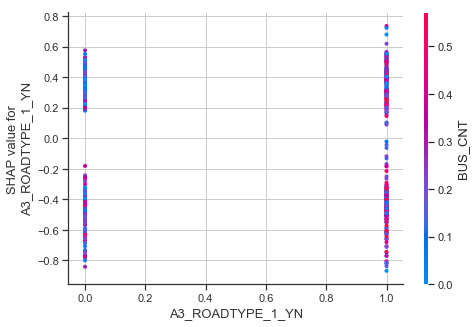

In [66]:
shap.dependence_plot(7, shap_values, X_test_500)

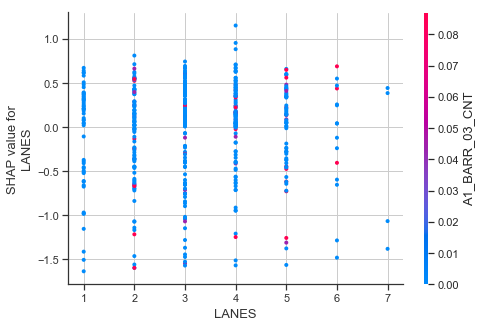

In [67]:
shap.dependence_plot(4, shap_values, X_test_500)

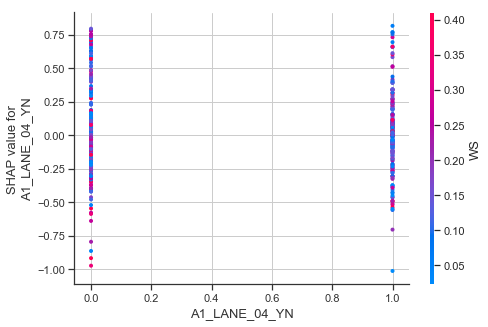

In [68]:
shap.dependence_plot(8, shap_values, X_test_500)

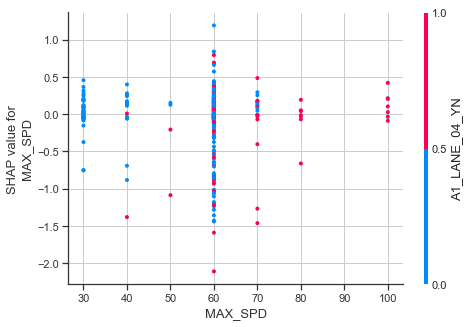

In [69]:
shap.dependence_plot(3, shap_values, X_test_500)

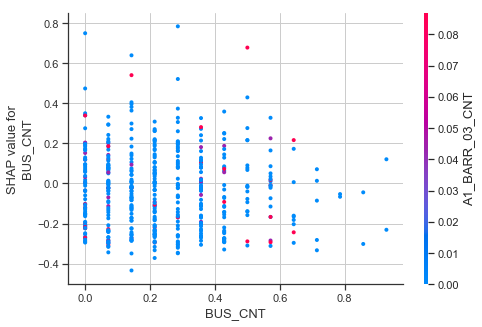

In [71]:
shap.dependence_plot(20, shap_values, X_test_500)

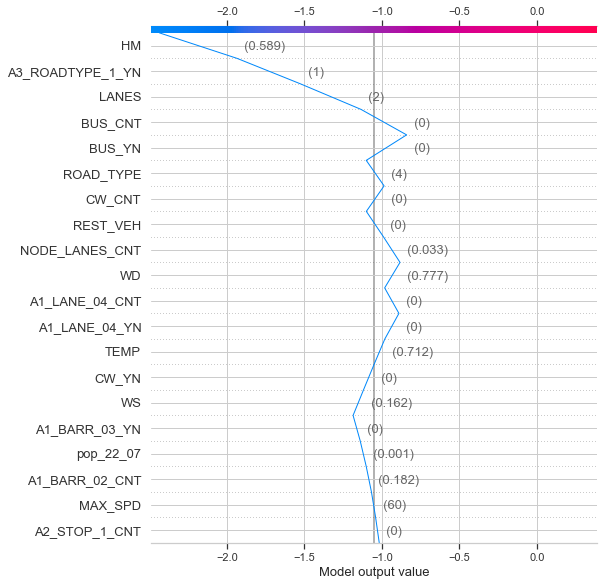

In [72]:
# link = 'logit' 을 추가 할 경우, 모델의 출력 값을 [0,1] 로 변환.
shap.decision_plot(explainer_shap.expected_value,
                   shap_values[0, :],
                   X_test_500.iloc[0, :],
                   ignore_warnings = True,
                   feature_names=X_test.columns.tolist()
                  )

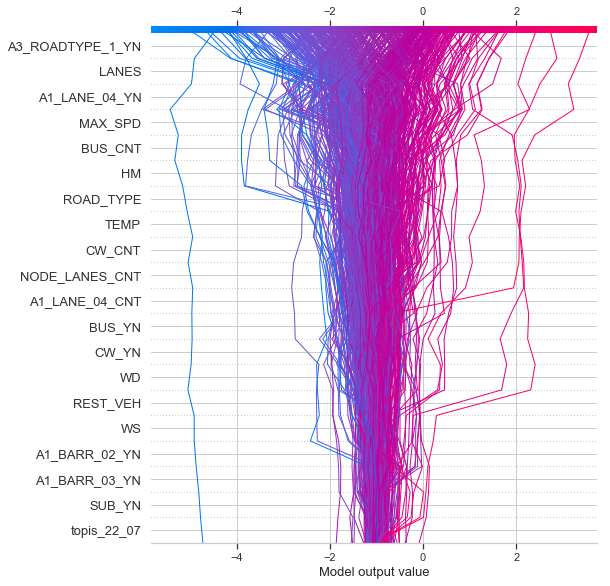

In [73]:
# link = 'logit' 을 추가 할 경우, 모델의 출력 값을 [0,1] 로 변환.
shap.decision_plot(explainer_shap.expected_value,
                   shap_values,
                   X_test_500,
                   ignore_warnings = True,
                   feature_names=X_test.columns.tolist()
                  )

# LIME - Explanation 

In [39]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.tolist(), 
                                                   training_labels = y_train.values,
                                                   feature_selection = 'lasso_path',
                                                   class_names=[0, 1], 
                                                   discretize_continuous=False,
                                                   discretizer = 'entropy',
                                                   verbose = True,
                                                   mode = 'classification')

In [40]:
n_row = 777
num_features = X_train.shape[1]
num_features

36

Intercept 0.29980894640014366
Prediction_local [0.30189076]
Right: 0.3092089869510744


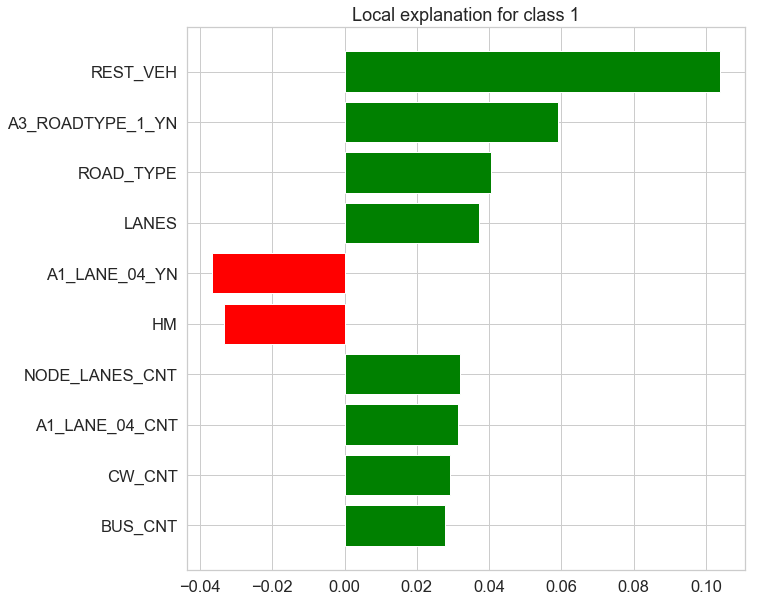

In [52]:
exp = explainer.explain_instance(X_test.iloc[n_row, :], net.predict_proba, num_features=10)
exp.show_in_notebook(show_table=True)

exp.as_pyplot_figure()

plt.rcParams["figure.figsize"] = (10,10)
plt.show()
# plt.savefig('lime/dnn_lime_1.png')

# SP - LIME

In [43]:
sp_obj = submodular_pick.SubmodularPick(explainer, X_train.values, net.predict_proba, sample_size=5000, num_features=num_features, 
                                        num_exps_desired=5)

Intercept 0.3014813397003166
Prediction_local [0.49282947]
Right: 0.7719807302198632
Intercept 0.7036839241610767
Prediction_local [0.75205362]
Right: 0.8208757013135529
Intercept 0.7019919766760675
Prediction_local [0.85560534]
Right: 0.822933108835883
Intercept 0.2945307480024965
Prediction_local [0.36853063]
Right: 0.5809865071845228
Intercept 0.29617323535670703
Prediction_local [0.53893023]
Right: 0.6911023491881905
Intercept 0.6984921407560288
Prediction_local [0.69629124]
Right: 0.682182102500681
Intercept 0.7000651869861146
Prediction_local [0.90883825]
Right: 0.9701597297347841
Intercept 0.6990484683390122
Prediction_local [0.55836186]
Right: 0.5907944089113214
Intercept 0.7004417099429031
Prediction_local [0.41831945]
Right: 0.8481967748296533
Intercept 0.7013740073688846
Prediction_local [0.94074745]
Right: 0.9838803649752671
Intercept 0.5860173344874242
Prediction_local [0.79440906]
Right: 0.7950538506706673
Intercept 0.7049516442108279
Prediction_local [0.85927285]
Right: 

Intercept 0.2928298023905415
Prediction_local [0.58472953]
Right: 0.9279268764877254
Intercept 0.703516112291742
Prediction_local [0.80409614]
Right: 0.8722405148166118
Intercept 0.2940253324000014
Prediction_local [0.33516212]
Right: 0.5209289484290165
Intercept 0.7017043789325423
Prediction_local [0.73808919]
Right: 0.8675722490134548
Intercept 0.7051565596852565
Prediction_local [0.65942526]
Right: 0.5880686180273239
Intercept 0.7024187919013085
Prediction_local [0.27649613]
Right: 0.6645382032202845
Intercept 0.2997677011451066
Prediction_local [0.46477486]
Right: 0.5561488928395806
Intercept 0.699924233270406
Prediction_local [0.90638294]
Right: 0.973482798254515
Intercept 0.300705441839661
Prediction_local [0.37093574]
Right: 0.554168846322207
Intercept 0.706196034096577
Prediction_local [0.85623002]
Right: 0.899183359581812
Intercept 0.7043453675143913
Prediction_local [0.75496658]
Right: 0.690697286094371
Intercept 0.70500891676982
Prediction_local [0.84311815]
Right: 0.9446914

Intercept 0.7004811983268479
Prediction_local [0.7383747]
Right: 0.525353053548466
Intercept 0.2962712888661798
Prediction_local [0.30443738]
Right: 0.6869274891313947
Intercept 0.7025076203744344
Prediction_local [0.82945597]
Right: 0.8753315713516094
Intercept 0.7075100964935969
Prediction_local [0.78775485]
Right: 0.8196384621021792
Intercept 0.29649668971389753
Prediction_local [0.30408285]
Right: 0.6152973654814429
Intercept 0.7080123711325942
Prediction_local [0.76203097]
Right: 0.7386150185673722
Intercept 0.2959848986780311
Prediction_local [0.79054134]
Right: 0.7860299482488969
Intercept 0.7037680995377291
Prediction_local [0.81439013]
Right: 0.8738212446858847
Intercept 0.7031273072903004
Prediction_local [0.72934822]
Right: 0.5907075418219478
Intercept 0.699695038380567
Prediction_local [0.86426934]
Right: 0.9061633448964546
Intercept 0.2961146995274201
Prediction_local [0.31331206]
Right: 0.7820085234526541
Intercept 0.7043445627320122
Prediction_local [0.88313069]
Right: 0

Intercept 0.3005851271683441
Prediction_local [0.37733844]
Right: 0.6405247994718167
Intercept 0.3002533054980372
Prediction_local [0.42499736]
Right: 0.5961184438335677
Intercept 0.2975056701564613
Prediction_local [0.38539266]
Right: 0.6159698204073889
Intercept 0.7001065380508619
Prediction_local [0.87916522]
Right: 0.9056456532052867
Intercept 0.700349604624609
Prediction_local [0.73829628]
Right: 0.8680116536577984
Intercept 0.7036353697942965
Prediction_local [0.65554662]
Right: 0.5295701640731725
Intercept 0.7014895381101971
Prediction_local [0.64928532]
Right: 0.5093582001980528
Intercept 0.7031284352972572
Prediction_local [0.91731344]
Right: 0.9393745568415378
Intercept 0.7085759105716057
Prediction_local [0.79856779]
Right: 0.6168696078987166
Intercept 0.7015296207776457
Prediction_local [0.65971633]
Right: 0.5586307766306909
Intercept 0.7018814446826315
Prediction_local [0.8097069]
Right: 0.8452844995362276
Intercept 0.30110419502095603
Prediction_local [0.34105624]
Right: 

Intercept 0.7002792662938041
Prediction_local [0.64883821]
Right: 0.923451463954247
Intercept 0.7002309470568479
Prediction_local [0.90078772]
Right: 0.9454473411927318
Intercept 0.6999243995503595
Prediction_local [0.54547113]
Right: 0.8442983365905602
Intercept 0.7003230637983863
Prediction_local [0.63212478]
Right: 0.6358557241632059
Intercept 0.7050278230668673
Prediction_local [0.80981292]
Right: 0.6750552282866884
Intercept 0.7072887067392244
Prediction_local [0.8019165]
Right: 0.9071555018147458
Intercept 0.7058396663848018
Prediction_local [0.90234424]
Right: 0.9354968266142485
Intercept 0.7016763791802886
Prediction_local [0.3309721]
Right: 0.5492844642290803
Intercept 0.7016849505120843
Prediction_local [0.72548952]
Right: 0.6848361422064575
Intercept 0.7022319747806287
Prediction_local [0.81960362]
Right: 0.9106435961104535
Intercept 0.703524137990239
Prediction_local [0.80324719]
Right: 0.697102215683814
Intercept 0.2952028691747585
Prediction_local [0.5955562]
Right: 0.753

Intercept 0.699878851827872
Prediction_local [0.86121184]
Right: 0.8851233205976583
Intercept 0.7032330271502587
Prediction_local [0.91738081]
Right: 0.9678213327511859
Intercept 0.29934538703545976
Prediction_local [0.7460847]
Right: 0.700855485268179
Intercept 0.29771579024417627
Prediction_local [0.34555583]
Right: 0.5180418981463516
Intercept 0.7060792738555729
Prediction_local [0.87924893]
Right: 0.9317627404808623
Intercept 0.2983170772029454
Prediction_local [0.42967492]
Right: 0.5534504004916638
Intercept 0.6991061578531479
Prediction_local [0.41094405]
Right: 0.5094297179148335
Intercept 0.2992815426951525
Prediction_local [0.44778077]
Right: 0.5644204948552834
Intercept 0.7050567406672882
Prediction_local [0.93695144]
Right: 0.9710144691843393
Intercept 0.7044270196079593
Prediction_local [0.90954865]
Right: 0.9632183866969918
Intercept 0.7021960646653039
Prediction_local [0.6492999]
Right: 0.589474964095308
Intercept 0.29807121378340035
Prediction_local [0.51829933]
Right: 0

Intercept 0.7029978955355979
Prediction_local [0.80585834]
Right: 0.8823014444202513
Intercept 0.703419767970703
Prediction_local [0.67677417]
Right: 0.5344375149891989
Intercept 0.7068612093594233
Prediction_local [0.8471987]
Right: 0.841391272559617
Intercept 0.7089500930376914
Prediction_local [0.71951304]
Right: 0.5515609269518873
Intercept 0.2973033542516563
Prediction_local [0.63530932]
Right: 0.5368560265821497
Intercept 0.7062977758211054
Prediction_local [0.80113414]
Right: 0.688757725371182
Intercept 0.7007469852505938
Prediction_local [0.65590858]
Right: 0.5925427173189473
Intercept 0.7041659806983305
Prediction_local [0.89165013]
Right: 0.9716902822480648
Intercept 0.29644553064679596
Prediction_local [0.40683209]
Right: 0.8038331982121024
Intercept 0.7007352233990262
Prediction_local [0.80662226]
Right: 0.9073751549940917
Intercept 0.29504598897414697
Prediction_local [0.344967]
Right: 0.656624285685934
Intercept 0.7007078852388083
Prediction_local [0.79218972]
Right: 0.85

Intercept 0.7044334886809885
Prediction_local [0.75682575]
Right: 0.7948837693082894
Intercept 0.7005856675471256
Prediction_local [0.71546366]
Right: 0.8380502832663712
Intercept 0.297199143226007
Prediction_local [0.32614704]
Right: 0.5172937027039465
Intercept 0.29902546713511907
Prediction_local [0.50546794]
Right: 0.737740697357065
Intercept 0.7025486256550108
Prediction_local [0.80032335]
Right: 0.59112995483253
Intercept 0.7040484557062624
Prediction_local [0.6656318]
Right: 0.7630890480079865
Intercept 0.29890311520748863
Prediction_local [0.41364855]
Right: 0.7630747259792059
Intercept 0.7011235057784969
Prediction_local [0.74588044]
Right: 0.6413586982048876
Intercept 0.6987197361703573
Prediction_local [0.73048851]
Right: 0.7485811600040102
Intercept 0.6996839220305074
Prediction_local [0.68068766]
Right: 0.5309868339561812
Intercept 0.7050765071261678
Prediction_local [0.85276539]
Right: 0.930218256900001
Intercept 0.7055377401956882
Prediction_local [0.82561042]
Right: 0.8

Intercept 0.7011095985281424
Prediction_local [0.80719234]
Right: 0.8416488633494346
Intercept 0.6996817227499929
Prediction_local [0.74024023]
Right: 0.5310255911001789
Intercept 0.7050950421821056
Prediction_local [0.74570472]
Right: 0.5829841129405207
Intercept 0.29082191266264584
Prediction_local [0.75836839]
Right: 0.9404851322709695
Intercept 0.701867666942252
Prediction_local [0.88779373]
Right: 0.9154428985343072
Intercept 0.7019905493676897
Prediction_local [0.81301815]
Right: 0.9443681594919927
Intercept 0.6984877400557324
Prediction_local [0.72900843]
Right: 0.5341989018930281
Intercept 0.6999847293143795
Prediction_local [0.79924136]
Right: 0.8048866603419287
Intercept 0.7083337851760813
Prediction_local [0.82475868]
Right: 0.9654226208848187
Intercept 0.7079459409610979
Prediction_local [0.86984038]
Right: 0.9560811974680181
Intercept 0.2984471000139004
Prediction_local [0.49126223]
Right: 0.5938872544023234
Intercept 0.7036091507850615
Prediction_local [0.87754353]
Right:

Intercept 0.6966723411098888
Prediction_local [0.6223702]
Right: 0.6391375896282747
Intercept 0.7005587001353016
Prediction_local [0.88516369]
Right: 0.8996977263997141
Intercept 0.2951648642315942
Prediction_local [0.42485384]
Right: 0.8839346739300905
Intercept 0.2987090067707581
Prediction_local [0.79051671]
Right: 0.7049722720972628
Intercept 0.7016763350356853
Prediction_local [0.69668442]
Right: 0.7408461820301246
Intercept 0.7016716052988458
Prediction_local [0.79443821]
Right: 0.8358660776554516
Intercept 0.7072584251285001
Prediction_local [0.75112903]
Right: 0.6036331926607588
Intercept 0.29679072889840513
Prediction_local [0.45467669]
Right: 0.5243166869819159
Intercept 0.7006328996618656
Prediction_local [0.60835335]
Right: 0.6436396801746292
Intercept 0.7044963162049528
Prediction_local [0.81656121]
Right: 0.6998579279343096
Intercept 0.6944692840936836
Prediction_local [0.32990886]
Right: 0.5665934359795058
Intercept 0.6987955962907044
Prediction_local [0.83694141]
Right:

Intercept 0.6983552527582652
Prediction_local [0.68640343]
Right: 0.7251672987717128
Intercept 0.7041535575237101
Prediction_local [0.6974614]
Right: 0.5283393356581207
Intercept 0.2964343857230626
Prediction_local [0.3557471]
Right: 0.5678399157224
Intercept 0.707158499024611
Prediction_local [0.7238003]
Right: 0.5510683521239572
Intercept 0.30063404305767794
Prediction_local [0.44302705]
Right: 0.6376906815928265
Intercept 0.702258989122187
Prediction_local [0.6237531]
Right: 0.5033654479406537
Intercept 0.703395061186818
Prediction_local [0.86950986]
Right: 0.9033012097450529
Intercept 0.29883533712089716
Prediction_local [0.80395632]
Right: 0.7821279148732927
Intercept 0.7060067752948818
Prediction_local [0.78750363]
Right: 0.5220416254038316
Intercept 0.6996708727090547
Prediction_local [0.95219418]
Right: 0.9532083816711948
Intercept 0.7004872323389546
Prediction_local [0.80394387]
Right: 0.5383085316979881
Intercept 0.7015127285416134
Prediction_local [0.70356687]
Right: 0.62192

Intercept 0.7021789955199238
Prediction_local [0.71424048]
Right: 0.7712863163187362
Intercept 0.6986339452110636
Prediction_local [0.65595003]
Right: 0.7061828564198126
Intercept 0.7023038578216352
Prediction_local [0.74593475]
Right: 0.7595716013818665
Intercept 0.7017677446991465
Prediction_local [0.91744341]
Right: 0.9485224272000236
Intercept 0.7037518051462937
Prediction_local [0.67732593]
Right: 0.5466685961370761
Intercept 0.2995149557073421
Prediction_local [0.50344698]
Right: 0.8389151913633014
Intercept 0.296069518740875
Prediction_local [0.52210917]
Right: 0.7179574659391311
Intercept 0.7013029766580813
Prediction_local [0.80819097]
Right: 0.7349439041918147
Intercept 0.7087735052277311
Prediction_local [0.89842677]
Right: 0.8971434519013324
Intercept 0.7017937612724221
Prediction_local [0.73335244]
Right: 0.5033993261797406
Intercept 0.7053509308728253
Prediction_local [0.74982278]
Right: 0.5193130172079536
Intercept 0.2937223700825254
Prediction_local [0.2841556]
Right: 0

Intercept 0.7030012882782759
Prediction_local [0.78554373]
Right: 0.8512475155657184
Intercept 0.6977149063718553
Prediction_local [0.68083992]
Right: 0.9756450975468639
Intercept 0.7035941039693114
Prediction_local [0.35590097]
Right: 0.5318106946485457
Intercept 0.701289243671138
Prediction_local [0.60803188]
Right: 0.6022342595009578
Intercept 0.3014742943591157
Prediction_local [0.76831219]
Right: 0.5317643504719439
Intercept 0.70368775939538
Prediction_local [0.77013503]
Right: 0.8624089399746487
Intercept 0.7025838541806669
Prediction_local [0.72215235]
Right: 0.6729042504868588
Intercept 0.7036425296204243
Prediction_local [0.889703]
Right: 0.910344193494649
Intercept 0.7034237889815388
Prediction_local [0.86687538]
Right: 0.8380685578312107
Intercept 0.7099769344727095
Prediction_local [0.88570553]
Right: 0.8784304212536982
Intercept 0.7018366880190134
Prediction_local [0.74115734]
Right: 0.753766484546907
Intercept 0.7026426117720959
Prediction_local [0.62046074]
Right: 0.6882

Intercept 0.7038034929787736
Prediction_local [0.93335343]
Right: 0.941993852689474
Intercept 0.7040968728271848
Prediction_local [0.74025371]
Right: 0.5630382432064502
Intercept 0.7028937667039481
Prediction_local [0.64017232]
Right: 0.8586729324838908
Intercept 0.2965907469316504
Prediction_local [0.42683518]
Right: 0.6650232384482072
Intercept 0.2989379901983249
Prediction_local [0.42977465]
Right: 0.5830267281819512
Intercept 0.30048067616962226
Prediction_local [0.77563983]
Right: 0.5379492468441934
Intercept 0.7055744758824347
Prediction_local [0.79114927]
Right: 0.8401346783483048
Intercept 0.2968567713886902
Prediction_local [0.43240801]
Right: 0.5471260032551453
Intercept 0.7051396491225346
Prediction_local [0.88532057]
Right: 0.9740087061233731
Intercept 0.2913052616033469
Prediction_local [0.53139098]
Right: 0.500298935996367
Intercept 0.7062200788771409
Prediction_local [0.67422437]
Right: 0.8793942628865008
Intercept 0.7027158857700304
Prediction_local [0.84083734]
Right: 

Intercept 0.705946769372133
Prediction_local [0.82236375]
Right: 0.8568328407666285
Intercept 0.29353933016266665
Prediction_local [0.34610854]
Right: 0.6167520526369443
Intercept 0.7000613676987514
Prediction_local [0.66255304]
Right: 0.5149132813029637
Intercept 0.7002939011679187
Prediction_local [0.89044635]
Right: 0.8980225679366179
Intercept 0.6976475261921884
Prediction_local [0.43130975]
Right: 0.7646347976099642
Intercept 0.7023604928926354
Prediction_local [0.73912896]
Right: 0.8572366474705662
Intercept 0.7037191202251922
Prediction_local [0.91493579]
Right: 0.9329343520043268
Intercept 0.7028585436078324
Prediction_local [0.80201991]
Right: 0.516653352253987
Intercept 0.30057826900829243
Prediction_local [0.73983394]
Right: 0.5205662637541981
Intercept 0.7027486162445353
Prediction_local [0.82153502]
Right: 0.8959266416308682
Intercept 0.6993760371915363
Prediction_local [0.73741686]
Right: 0.5177010473367161
Intercept 0.701796442804084
Prediction_local [0.88267426]
Right: 

Intercept 0.706400853993491
Prediction_local [0.90914922]
Right: 0.9685029645091926
Intercept 0.7009205785559628
Prediction_local [0.61043895]
Right: 0.8664303354197855
Intercept 0.7022756286680043
Prediction_local [0.87157067]
Right: 0.9690778752576544
Intercept 0.7025041568628693
Prediction_local [0.74798492]
Right: 0.7060111515414595
Intercept 0.7010612491729835
Prediction_local [0.76981386]
Right: 0.8260696435803516
Intercept 0.7046562527850638
Prediction_local [0.7612596]
Right: 0.7011326957598574
Intercept 0.7024228903422273
Prediction_local [0.92788231]
Right: 0.955126402658879
Intercept 0.29809083473215986
Prediction_local [0.34913725]
Right: 0.5771448630284403
Intercept 0.7060245980548658
Prediction_local [0.66958409]
Right: 0.6423955729904374
Intercept 0.7013905022947966
Prediction_local [0.80530115]
Right: 0.8099004699439575
Intercept 0.7025721769595878
Prediction_local [0.84856493]
Right: 0.8597409852080433
Intercept 0.7001044439156354
Prediction_local [0.79807574]
Right: 0

Intercept 0.7033863005768735
Prediction_local [0.79024347]
Right: 0.8903738795048063
Intercept 0.6978063551841459
Prediction_local [0.78265976]
Right: 0.8912068173404313
Intercept 0.701196619931823
Prediction_local [0.68274928]
Right: 0.9264547401193124
Intercept 0.296810839109804
Prediction_local [0.80368194]
Right: 0.7502213809760593
Intercept 0.7015419149689088
Prediction_local [0.85914303]
Right: 0.9536870641756967
Intercept 0.7045292840280052
Prediction_local [0.74814572]
Right: 0.615238579035384
Intercept 0.7029750147575268
Prediction_local [0.72352152]
Right: 0.6131795097574009
Intercept 0.7018075293725301
Prediction_local [0.40611331]
Right: 0.5884764372897511
Intercept 0.2983726764907604
Prediction_local [0.48108605]
Right: 0.689902490977541
Intercept 0.7072067627332895
Prediction_local [0.8445325]
Right: 0.8658445574616367
Intercept 0.7023714580270286
Prediction_local [0.73823229]
Right: 0.7905012005041194
Intercept 0.7015456805287598
Prediction_local [0.78819658]
Right: 0.81

Intercept 0.7052780889638045
Prediction_local [0.30242485]
Right: 0.5324818145905095
Intercept 0.7021874520155027
Prediction_local [0.79716498]
Right: 0.7522558999994933
Intercept 0.704342252161097
Prediction_local [0.87053712]
Right: 0.8950852115597389
Intercept 0.29841774206300575
Prediction_local [0.77974129]
Right: 0.5263809676862754
Intercept 0.7043887396281739
Prediction_local [0.66654873]
Right: 0.702361526431529
Intercept 0.7043316904862742
Prediction_local [0.81497325]
Right: 0.975804104293043
Intercept 0.7081666429038941
Prediction_local [0.87431944]
Right: 0.870342601238413
Intercept 0.7032807136626307
Prediction_local [0.69938577]
Right: 0.6354696271982867
Intercept 0.7047643367643666
Prediction_local [0.96022198]
Right: 0.9778451917819516
Intercept 0.6997682634719551
Prediction_local [0.23885345]
Right: 0.517497568060158
Intercept 0.6984649242782891
Prediction_local [0.65153556]
Right: 0.8595669844837535
Intercept 0.2972832639814965
Prediction_local [0.37276886]
Right: 0.7

Intercept 0.7002118913664109
Prediction_local [0.52276963]
Right: 0.7056731602633022
Intercept 0.7025827079215312
Prediction_local [0.88642225]
Right: 0.9354211612242068
Intercept 0.7011399663945818
Prediction_local [0.68856496]
Right: 0.5261437946514167
Intercept 0.7031340865604843
Prediction_local [0.72151621]
Right: 0.7571206333914662
Intercept 0.7045596967507716
Prediction_local [0.76872841]
Right: 0.594311911884505
Intercept 0.701807588934519
Prediction_local [0.79480582]
Right: 0.8106697040393709
Intercept 0.7047342730338664
Prediction_local [0.72617387]
Right: 0.7552059454337297
Intercept 0.7022571153104588
Prediction_local [0.90223436]
Right: 0.9197528754679948
Intercept 0.7030339739219635
Prediction_local [0.8005069]
Right: 0.8620074643192539
Intercept 0.7061836444391534
Prediction_local [0.81793142]
Right: 0.8695243194560418
Intercept 0.7035515456715348
Prediction_local [0.76195731]
Right: 0.5521744190832811
Intercept 0.7002641119557168
Prediction_local [0.79435436]
Right: 0.

Intercept 0.7022273768050865
Prediction_local [0.8139798]
Right: 0.9069359576948837
Intercept 0.7040474740564187
Prediction_local [0.74299984]
Right: 0.7692361688860125
Intercept 0.7035651277059446
Prediction_local [0.89662753]
Right: 0.9688718492233868
Intercept 0.703298336896922
Prediction_local [0.83134624]
Right: 0.8149440956564875
Intercept 0.7004965209019725
Prediction_local [0.8382285]
Right: 0.8678699282317521
Intercept 0.2987552240716069
Prediction_local [0.47185306]
Right: 0.5374188230119304
Intercept 0.7076723937442463
Prediction_local [0.88307015]
Right: 0.9494211363526592
Intercept 0.6972772090754616
Prediction_local [0.82302959]
Right: 0.8638926124163502
Intercept 0.7010348108347755
Prediction_local [0.65821196]
Right: 0.8932095068149917
Intercept 0.7020686502648776
Prediction_local [0.79050923]
Right: 0.7754296442191948
Intercept 0.703292865325716
Prediction_local [0.68068943]
Right: 0.5284720294012919
Intercept 0.7022378133559961
Prediction_local [0.75787575]
Right: 0.7

Intercept 0.7016901916497632
Prediction_local [0.78483246]
Right: 0.812140228563426
Intercept 0.701503148924728
Prediction_local [0.81780471]
Right: 0.957088496630488
Intercept 0.7078463362549954
Prediction_local [0.64990051]
Right: 0.7150655383315985
Intercept 0.7047144862970168
Prediction_local [0.91183525]
Right: 0.9246653418260289
Intercept 0.7024750933777242
Prediction_local [0.82912418]
Right: 0.8743840633369566
Intercept 0.7025551154447766
Prediction_local [0.86502214]
Right: 0.883929525711908
Intercept 0.7059051547220568
Prediction_local [0.89752412]
Right: 0.9027117859109689
Intercept 0.7040147741073031
Prediction_local [0.83266409]
Right: 0.9427779964979923
Intercept 0.6986983273586063
Prediction_local [0.84908885]
Right: 0.9660705085605019
Intercept 0.7018212768724473
Prediction_local [0.6640455]
Right: 0.9055499779271214
Intercept 0.29470112055524433
Prediction_local [0.34361364]
Right: 0.6465472131933007
Intercept 0.7054113070908826
Prediction_local [0.7932537]
Right: 0.76

Intercept 0.7019139663719538
Prediction_local [0.7593615]
Right: 0.5562524642089297
Intercept 0.7005809598221472
Prediction_local [0.72180659]
Right: 0.6552817946341118
Intercept 0.7081651749442079
Prediction_local [0.88853895]
Right: 0.9425439799185071
Intercept 0.7030251839646637
Prediction_local [0.7721448]
Right: 0.5267901877246731
Intercept 0.7027485902684046
Prediction_local [0.70596179]
Right: 0.7741128440544002
Intercept 0.7045208142603235
Prediction_local [0.86857694]
Right: 0.9072481142889792
Intercept 0.29792098884874646
Prediction_local [0.36470493]
Right: 0.5974943184070401
Intercept 0.2970172905301213
Prediction_local [0.34077854]
Right: 0.502120855190627
Intercept 0.7011868279277401
Prediction_local [0.71032522]
Right: 0.7461896958748921
Intercept 0.70554439956633
Prediction_local [0.84592385]
Right: 0.9123909923314402
Intercept 0.706584057679752
Prediction_local [0.6580426]
Right: 0.6188552011709202
Intercept 0.7069439527421384
Prediction_local [0.82857131]
Right: 0.909

Intercept 0.7055654581160661
Prediction_local [0.98157206]
Right: 0.9910841762834921
Intercept 0.7011305273413699
Prediction_local [0.58586461]
Right: 0.5676133740921352
Intercept 0.7009066417121589
Prediction_local [0.80515884]
Right: 0.859101563321436
Intercept 0.29592147405253905
Prediction_local [0.38831165]
Right: 0.7158310408620849
Intercept 0.7033059998825734
Prediction_local [0.65871935]
Right: 0.5963991253367387
Intercept 0.7061935808384217
Prediction_local [0.54280716]
Right: 0.5305982456961844
Intercept 0.29482814572926025
Prediction_local [0.31430989]
Right: 0.572119889720287
Intercept 0.6998293657544454
Prediction_local [0.90066781]
Right: 0.9326064782733972
Intercept 0.7046917163863647
Prediction_local [0.80757851]
Right: 0.5520384565408958
Intercept 0.29941666071195044
Prediction_local [0.51612182]
Right: 0.8029941609572938
Intercept 0.2990652095312366
Prediction_local [0.37043818]
Right: 0.5387848424366295
Intercept 0.699758784934136
Prediction_local [0.65295222]
Right:

Intercept 0.7030775393710371
Prediction_local [0.86370066]
Right: 0.8944585721540101
Intercept 0.7031022212717307
Prediction_local [0.7069186]
Right: 0.7320465397517664
Intercept 0.7008213668846847
Prediction_local [0.51414397]
Right: 0.5438008865056352
Intercept 0.29376913808026567
Prediction_local [0.80562727]
Right: 0.7256867449831573
Intercept 0.7019536443323157
Prediction_local [0.81572198]
Right: 0.9738037412742555
Intercept 0.2961027487693578
Prediction_local [0.37523967]
Right: 0.594406555970298
Intercept 0.705022988542327
Prediction_local [0.68807684]
Right: 0.5496169886279736
Intercept 0.7011886110849871
Prediction_local [0.9147474]
Right: 0.9222640798631326
Intercept 0.6994974908636722
Prediction_local [0.65572434]
Right: 0.5480940340440196
Intercept 0.7020171394606197
Prediction_local [0.78757695]
Right: 0.6905610968302017
Intercept 0.700553013485826
Prediction_local [0.89376378]
Right: 0.977815272594659
Intercept 0.7034231263360743
Prediction_local [0.65154723]
Right: 0.53

Intercept 0.7014678589413215
Prediction_local [0.61245408]
Right: 0.611989277950664
Intercept 0.7096113038243004
Prediction_local [0.75092456]
Right: 0.6628676694515115
Intercept 0.2947525218336866
Prediction_local [0.63843421]
Right: 0.5914024154285953
Intercept 0.7011678883219767
Prediction_local [0.83394238]
Right: 0.8656838580018431
Intercept 0.6997843824248671
Prediction_local [0.78503737]
Right: 0.9223723430883274
Intercept 0.2916578907990144
Prediction_local [0.43501639]
Right: 0.5818890007049328
Intercept 0.7045886483683933
Prediction_local [0.85831704]
Right: 0.7082660512862492
Intercept 0.7018682911969965
Prediction_local [0.85245281]
Right: 0.9461313286312929
Intercept 0.6970069075305833
Prediction_local [0.90423987]
Right: 0.8864650192198487
Intercept 0.698414359800399
Prediction_local [0.5962174]
Right: 0.8484958363857966
Intercept 0.7028160881454423
Prediction_local [0.86918254]
Right: 0.8439517265836779
Intercept 0.7008963269878432
Prediction_local [0.77303709]
Right: 0.

Intercept 0.704832926488869
Prediction_local [0.8264193]
Right: 0.8909827980399825
Intercept 0.704259704307946
Prediction_local [0.8178267]
Right: 0.8576630636091714
Intercept 0.6982885763031235
Prediction_local [0.506594]
Right: 0.8546647021093248
Intercept 0.707213070100224
Prediction_local [0.73537341]
Right: 0.9080258045283751
Intercept 0.29927762109044037
Prediction_local [0.43614777]
Right: 0.5751490859524213
Intercept 0.699582774660308
Prediction_local [0.73036347]
Right: 0.507094560238814
Intercept 0.6987010758609149
Prediction_local [0.64995007]
Right: 0.7582684802019183
Intercept 0.7077737045427923
Prediction_local [0.85197058]
Right: 0.8422230711562735
Intercept 0.7020689144727863
Prediction_local [0.80993665]
Right: 0.633063822963021
Intercept 0.2983563280877559
Prediction_local [0.45690834]
Right: 0.8883490092326549
Intercept 0.7085385476774854
Prediction_local [0.89227141]
Right: 0.897478651335992
Intercept 0.7011565682643588
Prediction_local [0.76065593]
Right: 0.7567227

Intercept 0.7029653946849047
Prediction_local [0.76034308]
Right: 0.8645086289534978
Intercept 0.2955921855123511
Prediction_local [0.38655087]
Right: 0.6960168832251619
Intercept 0.7055907699081112
Prediction_local [0.74666189]
Right: 0.8519333117833146
Intercept 0.70462271130327
Prediction_local [0.77968759]
Right: 0.7913639833155643
Intercept 0.2915468385496354
Prediction_local [0.42849737]
Right: 0.5532600990733202
Intercept 0.7071739913488646
Prediction_local [0.60199453]
Right: 0.6575767347634797
Intercept 0.7040850681804136
Prediction_local [0.86963198]
Right: 0.969778710588753
Intercept 0.7030354913738734
Prediction_local [0.78451416]
Right: 0.7856975409548685
Intercept 0.7035767725440082
Prediction_local [0.86389348]
Right: 0.8943043102666788
Intercept 0.7069780429403122
Prediction_local [0.76798612]
Right: 0.8251360327579059
Intercept 0.2962131545885522
Prediction_local [0.33901707]
Right: 0.7678051379252667
Intercept 0.7056365000550959
Prediction_local [0.84917944]
Right: 0.

Intercept 0.7016534393601558
Prediction_local [0.7676612]
Right: 0.6846104629116516
Intercept 0.29893307507558536
Prediction_local [0.44279279]
Right: 0.6802045796827807
Intercept 0.7056631108606238
Prediction_local [0.84322307]
Right: 0.7903724101449457
Intercept 0.7045331901728935
Prediction_local [0.87391371]
Right: 0.9570737975527387
Intercept 0.29792062116254053
Prediction_local [0.47925681]
Right: 0.5853080013451458
Intercept 0.7032058774431922
Prediction_local [0.83943439]
Right: 0.8521220490332275
Intercept 0.7014762725833764
Prediction_local [0.92502627]
Right: 0.9655411521938493
Intercept 0.7018765495264893
Prediction_local [0.89095183]
Right: 0.8839628574517131
Intercept 0.7025819372370775
Prediction_local [0.34394285]
Right: 0.5301378228046145
Intercept 0.7033247114837804
Prediction_local [0.79968116]
Right: 0.7743573766364942
Intercept 0.7049913424552257
Prediction_local [0.80054254]
Right: 0.9136451138314857
Intercept 0.7017138959776863
Prediction_local [0.60739177]
Right

Intercept 0.6964353409577693
Prediction_local [0.86645759]
Right: 0.9636641795555337
Intercept 0.7054795277027325
Prediction_local [0.72555772]
Right: 0.6721830029615037
Intercept 0.7000988183486222
Prediction_local [0.75744016]
Right: 0.768831565616114
Intercept 0.6971250427504536
Prediction_local [0.86090631]
Right: 0.9513444761901917
Intercept 0.7006019179540879
Prediction_local [0.74687714]
Right: 0.572359478069006
Intercept 0.7018938989208336
Prediction_local [0.41349963]
Right: 0.8213206797354554
Intercept 0.7060074107460895
Prediction_local [0.81588371]
Right: 0.8150449427227412
Intercept 0.7001917291868893
Prediction_local [0.5923491]
Right: 0.7038992877053014
Intercept 0.2946855097793187
Prediction_local [0.37811594]
Right: 0.6280251965496306
Intercept 0.7011517707190252
Prediction_local [0.82731771]
Right: 0.8011153215427439
Intercept 0.702556963622512
Prediction_local [0.98375735]
Right: 0.9754255862683848
Intercept 0.7062736775442993
Prediction_local [0.60923384]
Right: 0.8

Intercept 0.7006865536388979
Prediction_local [0.77964574]
Right: 0.798923634188443
Intercept 0.6985108664527696
Prediction_local [0.74498387]
Right: 0.9002752602633161
Intercept 0.29779799005170615
Prediction_local [0.28324132]
Right: 0.6944878033405378
Intercept 0.6993721273194337
Prediction_local [0.59804465]
Right: 0.5486150274179525
Intercept 0.7018107433601137
Prediction_local [0.77295061]
Right: 0.8082418666141246
Intercept 0.30097176427098926
Prediction_local [0.43075533]
Right: 0.5171597149994062
Intercept 0.7060613747390639
Prediction_local [0.93053165]
Right: 0.9864266842824722
Intercept 0.29441655771981257
Prediction_local [0.47146154]
Right: 0.7737065939751084
Intercept 0.29465043086495085
Prediction_local [0.37066947]
Right: 0.5679603185601735
Intercept 0.7009512951922318
Prediction_local [0.77962009]
Right: 0.8396408484546094
Intercept 0.7045768485690526
Prediction_local [0.85907825]
Right: 0.8973831283438338
Intercept 0.7022114334989618
Prediction_local [0.84487689]
Rig

Intercept 0.7013265934162171
Prediction_local [0.82619912]
Right: 0.795102735649074
Intercept 0.6962896711449315
Prediction_local [0.63111656]
Right: 0.6193556286206177
Intercept 0.7026417270671645
Prediction_local [0.7187816]
Right: 0.7221853209852029
Intercept 0.7045794656019706
Prediction_local [0.7870845]
Right: 0.919408138033915
Intercept 0.7007021960998455
Prediction_local [0.90575282]
Right: 0.9373238683588389
Intercept 0.70431465469541
Prediction_local [0.77467729]
Right: 0.7957378690801908
Intercept 0.7025462133772228
Prediction_local [0.71159445]
Right: 0.8366014685502995
Intercept 0.704338114071811
Prediction_local [0.6904288]
Right: 0.5180998159879431
Intercept 0.6997490338602925
Prediction_local [0.71817793]
Right: 0.8799152563146165
Intercept 0.2977294344079477
Prediction_local [0.40613102]
Right: 0.6101899592170348
Intercept 0.7065595159620083
Prediction_local [0.83282909]
Right: 0.7600551691352416
Intercept 0.704223277957147
Prediction_local [0.77813226]
Right: 0.849336

Intercept 0.7015832288606662
Prediction_local [0.8653906]
Right: 0.8281676112146474
Intercept 0.7017574474075347
Prediction_local [0.7203065]
Right: 0.5453860727289495
Intercept 0.7023785807098026
Prediction_local [0.70289663]
Right: 0.551767027940486
Intercept 0.6999133061203529
Prediction_local [0.64542638]
Right: 0.5067594385857834
Intercept 0.7010817890946522
Prediction_local [0.68289564]
Right: 0.8951687716044153
Intercept 0.29951823473569994
Prediction_local [0.8177264]
Right: 0.6999279176070878
Intercept 0.7043580654031858
Prediction_local [0.6450691]
Right: 0.644637676917206
Intercept 0.29270291495258105
Prediction_local [0.59595156]
Right: 0.66868302818024
Intercept 0.6997203149289561
Prediction_local [0.73734992]
Right: 0.6444609181660208
Intercept 0.7044085519553749
Prediction_local [0.65812114]
Right: 0.5778830518311704
Intercept 0.29577494763383055
Prediction_local [0.37199032]
Right: 0.7903216031518466
Intercept 0.2982529194510578
Prediction_local [0.29817291]
Right: 0.59

Intercept 0.7020244747519478
Prediction_local [0.34995844]
Right: 0.9809262488880188
Intercept 0.704957862471254
Prediction_local [0.49006787]
Right: 0.5161635842653839
Intercept 0.6995128229033569
Prediction_local [0.72900751]
Right: 0.5879139894787248
Intercept 0.7053990316612764
Prediction_local [0.54702329]
Right: 0.5266688099531027
Intercept 0.7032770694330631
Prediction_local [0.78620867]
Right: 0.7170603121532323
Intercept 0.6987853465233637
Prediction_local [0.83640018]
Right: 0.9603152979055406
Intercept 0.2951744004277791
Prediction_local [0.32260649]
Right: 0.5443795672230007
Intercept 0.7040995516664864
Prediction_local [0.87301336]
Right: 0.9296832947460358
Intercept 0.699781881086032
Prediction_local [0.64843728]
Right: 0.5620098801401452
Intercept 0.2965868348031478
Prediction_local [0.6947432]
Right: 0.5116777989797933
Intercept 0.29511695669874344
Prediction_local [0.36680345]
Right: 0.6663642546776689
Intercept 0.29519191458198135
Prediction_local [0.25597208]
Right: 

Intercept 0.7035605911882914
Prediction_local [0.71135694]
Right: 0.788544088982238
Intercept 0.7023836051568958
Prediction_local [0.41760504]
Right: 0.5587056104508066
Intercept 0.699608000903159
Prediction_local [0.69562661]
Right: 0.7407637392625758
Intercept 0.7079236902135435
Prediction_local [0.80877251]
Right: 0.6990243548384498
Intercept 0.7038965549834901
Prediction_local [0.7889006]
Right: 0.9343843940569239
Intercept 0.7015190983977343
Prediction_local [0.83028185]
Right: 0.7740334742777566
Intercept 0.297330502721526
Prediction_local [0.7325877]
Right: 0.5809508001800685
Intercept 0.6996792228615654
Prediction_local [0.89018839]
Right: 0.9565107885341784
Intercept 0.2974476341863561
Prediction_local [0.27996751]
Right: 0.500469724579073
Intercept 0.6970701558552593
Prediction_local [0.65420415]
Right: 0.584204890453588
Intercept 0.7023061056642456
Prediction_local [0.79894791]
Right: 0.743459114444788
Intercept 0.7078301850991258
Prediction_local [0.66150127]
Right: 0.62521

Intercept 0.7020099586530717
Prediction_local [0.87118142]
Right: 0.9223334861806235
Intercept 0.7057408274649719
Prediction_local [0.75616625]
Right: 0.780267824731482
Intercept 0.7037130664241918
Prediction_local [0.81163247]
Right: 0.8243356001366554
Intercept 0.7036530937300369
Prediction_local [0.72349435]
Right: 0.9312740900291759
Intercept 0.7030145450013147
Prediction_local [0.92176917]
Right: 0.9500869038760447
Intercept 0.700334049076348
Prediction_local [0.81749082]
Right: 0.9678641432436184
Intercept 0.70606825735957
Prediction_local [0.87498301]
Right: 0.8949304970239317
Intercept 0.7001549288526168
Prediction_local [0.88716875]
Right: 0.8688032770435977
Intercept 0.2982592729792209
Prediction_local [0.37009611]
Right: 0.7251724536284144
Intercept 0.7031546176962802
Prediction_local [0.65752029]
Right: 0.741900276441323
Intercept 0.2934679396789285
Prediction_local [0.25071111]
Right: 0.5208466947596291
Intercept 0.702684279647082
Prediction_local [0.21388027]
Right: 0.573

Intercept 0.6973262315867488
Prediction_local [0.85849729]
Right: 0.9257632510549266
Intercept 0.7016797937301541
Prediction_local [0.79481249]
Right: 0.7165892692752812
Intercept 0.7071301441806837
Prediction_local [0.75291673]
Right: 0.6080388416566571
Intercept 0.2992722550391825
Prediction_local [0.25050966]
Right: 0.5032073315284106
Intercept 0.7054124351595432
Prediction_local [0.74975185]
Right: 0.8910883568692319
Intercept 0.7043582239156491
Prediction_local [0.71068831]
Right: 0.5252347480431065
Intercept 0.29571900818652097
Prediction_local [0.69772364]
Right: 0.6495468751788813
Intercept 0.7037191661108259
Prediction_local [0.74245023]
Right: 0.5555818351363334
Intercept 0.7007958101689898
Prediction_local [0.68428806]
Right: 0.7228358679932372
Intercept 0.7060043917034371
Prediction_local [0.68379543]
Right: 0.5207799965785602
Intercept 0.7048369784470919
Prediction_local [0.81865813]
Right: 0.9732790914181777
Intercept 0.7014707424897338
Prediction_local [0.7771787]
Right:

Intercept 0.7020295315726771
Prediction_local [0.75071491]
Right: 0.9764581639724479
Intercept 0.7038211756933078
Prediction_local [0.6630559]
Right: 0.7475033132662525
Intercept 0.7010675782326057
Prediction_local [0.84077053]
Right: 0.8491172730881646
Intercept 0.29614553552385564
Prediction_local [0.27042384]
Right: 0.5955474568489438
Intercept 0.7011606335951921
Prediction_local [0.78388156]
Right: 0.7427846350379499
Intercept 0.29801199948288326
Prediction_local [0.39149145]
Right: 0.6771960347854747
Intercept 0.7059760668297678
Prediction_local [0.82765274]
Right: 0.8921964784412204
Intercept 0.7025834707395
Prediction_local [0.82895422]
Right: 0.923973805174709
Intercept 0.7007832598549536
Prediction_local [0.64158892]
Right: 0.710575466351377
Intercept 0.2984091584190564
Prediction_local [0.38886957]
Right: 0.6425861762166417
Intercept 0.29595308669285325
Prediction_local [0.38481521]
Right: 0.5502427260097972
Intercept 0.7041021932337271
Prediction_local [0.36543465]
Right: 0.

Intercept 0.7018992006898122
Prediction_local [0.60695042]
Right: 0.5804040728902615
Intercept 0.7018104387809049
Prediction_local [0.8015939]
Right: 0.6477832467204379
Intercept 0.7019210523280885
Prediction_local [0.65643201]
Right: 0.5298305960026708
Intercept 0.6960592566266957
Prediction_local [0.76031385]
Right: 0.7465576812292978
Intercept 0.706167389798197
Prediction_local [0.78358753]
Right: 0.8019089430833614
Intercept 0.7004503161603777
Prediction_local [0.5335442]
Right: 0.6580374057874636
Intercept 0.7034368918030829
Prediction_local [0.81247736]
Right: 0.8800752728994864
Intercept 0.7021920738088794
Prediction_local [0.64331377]
Right: 0.5628533959678664
Intercept 0.2950371263700634
Prediction_local [0.30507706]
Right: 0.5336471317169117
Intercept 0.3003084218956374
Prediction_local [0.465753]
Right: 0.5918554345426238
Intercept 0.7035136944678332
Prediction_local [0.7613626]
Right: 0.5602197419314565
Intercept 0.6986303341253698
Prediction_local [0.8385049]
Right: 0.9639

Intercept 0.30033065621251975
Prediction_local [0.27620769]
Right: 0.5383470612196577
Intercept 0.7018673802424179
Prediction_local [0.83756274]
Right: 0.9595292471450668
Intercept 0.701175756942408
Prediction_local [0.92973527]
Right: 0.9819516805601384
Intercept 0.7009760167394076
Prediction_local [0.81888842]
Right: 0.8599780311639394
Intercept 0.7048922732027634
Prediction_local [0.42706202]
Right: 0.7730232411447999
Intercept 0.7027888778854005
Prediction_local [0.66009238]
Right: 0.7016490844192469
Intercept 0.7015332612296217
Prediction_local [0.89079109]
Right: 0.9863867988275943
Intercept 0.7062135483417685
Prediction_local [0.63859915]
Right: 0.5692461151961082
Intercept 0.6970711789956928
Prediction_local [0.60157415]
Right: 0.9566351999203714
Intercept 0.7055193734303028
Prediction_local [0.82527088]
Right: 0.8574943720133015
Intercept 0.70254384802379
Prediction_local [0.86353193]
Right: 0.7678905878930621
Intercept 0.7004315049425628
Prediction_local [0.77925845]
Right: 0

Intercept 0.6991895912813659
Prediction_local [0.79720361]
Right: 0.7423430579994763
Intercept 0.7027107136221882
Prediction_local [0.80850783]
Right: 0.6007366095500339
Intercept 0.7054538375469974
Prediction_local [0.67877797]
Right: 0.7019856024162133
Intercept 0.6987173400097046
Prediction_local [0.84850949]
Right: 0.9044250517478826
Intercept 0.7023223625507091
Prediction_local [0.42402395]
Right: 0.6854764280287694
Intercept 0.6992052395481678
Prediction_local [0.73667551]
Right: 0.5310209017514149
Intercept 0.2961972042313674
Prediction_local [0.46392984]
Right: 0.8127845658237801
Intercept 0.6995124490223477
Prediction_local [0.63378795]
Right: 0.8360199360102116
Intercept 0.7041136095932249
Prediction_local [0.73988253]
Right: 0.7737277096173666
Intercept 0.7009135180237012
Prediction_local [0.69945667]
Right: 0.6804649307662116
Intercept 0.7016836226014744
Prediction_local [0.87553661]
Right: 0.9197638544309581
Intercept 0.7006816514405114
Prediction_local [0.83655411]
Right:

Intercept 0.7020357149779259
Prediction_local [0.69878907]
Right: 0.543103587661647
Intercept 0.7052335794253041
Prediction_local [0.86464874]
Right: 0.943427761401138
Intercept 0.7108139415560755
Prediction_local [0.52956757]
Right: 0.6840908189538781
Intercept 0.7005941874526713
Prediction_local [0.94011997]
Right: 0.9670330775089249
Intercept 0.7016806888796884
Prediction_local [0.73324084]
Right: 0.8236504239980494
Intercept 0.7025844590950541
Prediction_local [0.64763791]
Right: 0.5722387523707874
Intercept 0.2995171331732599
Prediction_local [0.76998921]
Right: 0.5272166464796305
Intercept 0.29617237373399496
Prediction_local [0.3565813]
Right: 0.6279153505409888
Intercept 0.7071656390269044
Prediction_local [0.87745038]
Right: 0.9012994438151091
Intercept 0.7073353532076648
Prediction_local [0.82915341]
Right: 0.7175356860390691
Intercept 0.7019087239748097
Prediction_local [0.96773956]
Right: 0.9839216161087034
Intercept 0.30070832195035724
Prediction_local [0.74532242]
Right: 

Intercept 0.700798401055875
Prediction_local [0.17437352]
Right: 0.5092481078243414
Intercept 0.7038544013491754
Prediction_local [0.63852363]
Right: 0.7523877406151827
Intercept 0.3004381855524517
Prediction_local [0.2789217]
Right: 0.5434897113617071
Intercept 0.6975928746198521
Prediction_local [0.72561851]
Right: 0.5427300121986272
Intercept 0.7070256900264502
Prediction_local [0.7677156]
Right: 0.7885346981523339
Intercept 0.6982490136317688
Prediction_local [0.79475216]
Right: 0.944868380213283
Intercept 0.7016735741240081
Prediction_local [0.39620193]
Right: 0.5109814301103444
Intercept 0.7048973280458904
Prediction_local [0.880776]
Right: 0.8808641810503661
Intercept 0.7020694732818401
Prediction_local [0.75129142]
Right: 0.787189385255483
Intercept 0.6998061159134445
Prediction_local [0.83077693]
Right: 0.9404749390793772
Intercept 0.29619321345119476
Prediction_local [0.3791805]
Right: 0.6979252603118932
Intercept 0.7063488143483011
Prediction_local [0.8782126]
Right: 0.91472

Intercept 0.3012134881388399
Prediction_local [0.84351882]
Right: 0.8275193899642426
Intercept 0.7027227869990433
Prediction_local [1.01922583]
Right: 0.9934060687951703
Intercept 0.7029584119849578
Prediction_local [0.79776351]
Right: 0.7482015669266969
Intercept 0.7022495704720811
Prediction_local [0.80542623]
Right: 0.9363759937279628
Intercept 0.7026757120885958
Prediction_local [0.74571401]
Right: 0.6483111402987305
Intercept 0.7054420394041939
Prediction_local [0.80889109]
Right: 0.6261138263381497
Intercept 0.7060115352191165
Prediction_local [0.8346029]
Right: 0.8485750826450821
Intercept 0.29854206357497043
Prediction_local [0.43797653]
Right: 0.5974669779623553
Intercept 0.7024159016132353
Prediction_local [0.85239687]
Right: 0.9288998637982024
Intercept 0.7050560868726965
Prediction_local [0.83084622]
Right: 0.8050789337821094
Intercept 0.703325678180077
Prediction_local [0.94682085]
Right: 0.9920370717674248
Intercept 0.2966273192041169
Prediction_local [0.52091342]
Right: 

Intercept 0.7043444305534187
Prediction_local [0.87587959]
Right: 0.8571312531350509
Intercept 0.7001248067156667
Prediction_local [0.79154037]
Right: 0.7430297797126892
Intercept 0.7032930264689926
Prediction_local [0.7595558]
Right: 0.557569279850372
Intercept 0.7053533705097824
Prediction_local [0.84746136]
Right: 0.8766792197981702
Intercept 0.2982647265869285
Prediction_local [0.32963367]
Right: 0.5012306007338229
Intercept 0.29391663303221344
Prediction_local [0.30248712]
Right: 0.5180517742732023
Intercept 0.7033966936205249
Prediction_local [0.83598518]
Right: 0.893829506202712
Intercept 0.7032459090920786
Prediction_local [0.7033675]
Right: 0.5279729948158489
Intercept 0.7023565205877448
Prediction_local [0.83552069]
Right: 0.8628592922794381
Intercept 0.2973197326812465
Prediction_local [0.30107461]
Right: 0.5465314436887019
Intercept 0.7047634257516312
Prediction_local [0.50944256]
Right: 0.6624190716685876
Intercept 0.701004495470205
Prediction_local [0.77622251]
Right: 0.9

Intercept 0.7057043226718349
Prediction_local [0.85801954]
Right: 0.9128998552941031
Intercept 0.297573321775548
Prediction_local [0.28815799]
Right: 0.5623421957683377
Intercept 0.7027113514297441
Prediction_local [0.92436079]
Right: 0.9574066735257157
Intercept 0.7011726104737378
Prediction_local [0.82626848]
Right: 0.8646124514408331
Intercept 0.7044530174120944
Prediction_local [0.69923202]
Right: 0.6741314908161541
Intercept 0.299305233934351
Prediction_local [0.20480972]
Right: 0.5351842796790343
Intercept 0.7007854902755435
Prediction_local [0.83191117]
Right: 0.8255171699522256
Intercept 0.7045424590570741
Prediction_local [0.9195224]
Right: 0.9347807763649338
Intercept 0.2970388857064704
Prediction_local [0.37269944]
Right: 0.7385838227914233
Intercept 0.7028819419982193
Prediction_local [0.64367768]
Right: 0.5780021484719586
Intercept 0.7025696354198121
Prediction_local [0.77756481]
Right: 0.855838043862314
Intercept 0.7025133782575693
Prediction_local [0.76655366]
Right: 0.7

Intercept 0.7068344881937269
Prediction_local [0.79479629]
Right: 0.6357909604157652
Intercept 0.7033929607229505
Prediction_local [0.87625635]
Right: 0.9202547007860771
Intercept 0.7007866609592144
Prediction_local [0.57869064]
Right: 0.8810412942338722
Intercept 0.29462343864965074
Prediction_local [0.4157957]
Right: 0.7508185823303204
Intercept 0.7020658322423804
Prediction_local [0.86284324]
Right: 0.8859613471691696
Intercept 0.2968686305731972
Prediction_local [0.39287957]
Right: 0.6739553117958427
Intercept 0.6987794856395719
Prediction_local [0.78401814]
Right: 0.728712257756435
Intercept 0.7031328648705425
Prediction_local [0.61154044]
Right: 0.6060299797526778
Intercept 0.7042194637404431
Prediction_local [0.83172505]
Right: 0.9184664855891461
Intercept 0.6989570022483514
Prediction_local [0.37579575]
Right: 0.9176508424426755
Intercept 0.7013095881412976
Prediction_local [0.790462]
Right: 0.8759961951621942
Intercept 0.7024142518207619
Prediction_local [0.81130619]
Right: 0.

Intercept 0.6989487868356556
Prediction_local [0.80776576]
Right: 0.9048462666586037
Intercept 0.7045261780298075
Prediction_local [0.7702293]
Right: 0.634362047541678
Intercept 0.7025076224065663
Prediction_local [0.94133683]
Right: 0.9745440862890667
Intercept 0.7093885896014274
Prediction_local [0.77729629]
Right: 0.8030607646647124
Intercept 0.7076580355391233
Prediction_local [0.77729908]
Right: 0.7496261380445023
Intercept 0.2924831384255104
Prediction_local [0.29473018]
Right: 0.544690851867082
Intercept 0.7036047846269471
Prediction_local [0.83057243]
Right: 0.9163270345279738
Intercept 0.7018073201493749
Prediction_local [0.83274417]
Right: 0.7318470118673706
Intercept 0.2939499156050428
Prediction_local [0.60272464]
Right: 0.6369904029718445
Intercept 0.2962098174814809
Prediction_local [0.418721]
Right: 0.5140583188403227
Intercept 0.7025086910753318
Prediction_local [0.78953518]
Right: 0.7308817278860764
Intercept 0.7047880339151231
Prediction_local [0.94166069]
Right: 0.98

Intercept 0.2963039480071739
Prediction_local [0.38009234]
Right: 0.7163903271903488
Intercept 0.704250315467749
Prediction_local [0.89451388]
Right: 0.9657967411869086
Intercept 0.70152823502142
Prediction_local [0.66027192]
Right: 0.5390360954238222
Intercept 0.2996256204054562
Prediction_local [0.53261582]
Right: 0.6870053892159462
Intercept 0.7089667442722698
Prediction_local [0.62179307]
Right: 0.5395985983787519
Intercept 0.700841502300733
Prediction_local [0.73412031]
Right: 0.6556026003105266
Intercept 0.2979749026655696
Prediction_local [0.54462531]
Right: 0.7353225722858526
Intercept 0.6992986413324094
Prediction_local [0.65881103]
Right: 0.5943797098769914
Intercept 0.7001428600270729
Prediction_local [0.77778789]
Right: 0.8541451672249161
Intercept 0.7082903073659841
Prediction_local [0.68985431]
Right: 0.7079248374756326
Intercept 0.7033682464439839
Prediction_local [0.89279485]
Right: 0.9611257602853235
Intercept 0.6985363902909869
Prediction_local [0.69662139]
Right: 0.7

Intercept 0.7026772305108583
Prediction_local [0.8267792]
Right: 0.7914941154048777
Intercept 0.7027866554184748
Prediction_local [0.65933702]
Right: 0.6415410403080781
Intercept 0.7009629332230309
Prediction_local [0.74300924]
Right: 0.7137016479651943
Intercept 0.29393295810416065
Prediction_local [0.78001281]
Right: 0.5221905401134548
Intercept 0.7037228331111152
Prediction_local [0.73285387]
Right: 0.570910871937722
Intercept 0.7047757581298053
Prediction_local [0.81884666]
Right: 0.6361188289382039
Intercept 0.7061750556052901
Prediction_local [0.75090981]
Right: 0.8114735203214722
Intercept 0.2967100374712766
Prediction_local [0.67088192]
Right: 0.5453400808383806
Intercept 0.29752022255574107
Prediction_local [0.4432991]
Right: 0.5669576241971608
Intercept 0.6987754871715155
Prediction_local [0.9540367]
Right: 0.9780421682804928
Intercept 0.7046060542978914
Prediction_local [0.66124531]
Right: 0.5283862427003203
Intercept 0.7011576996662788
Prediction_local [0.8133089]
Right: 0.

Intercept 0.7052313991489483
Prediction_local [0.69691843]
Right: 0.6444641497844841
Intercept 0.7035263680727678
Prediction_local [0.90585055]
Right: 0.9800861167780762
Intercept 0.7030346163407705
Prediction_local [0.63616249]
Right: 0.9396727332409963
Intercept 0.7080676921386685
Prediction_local [0.7436535]
Right: 0.5056862287803661
Intercept 0.7032844386000775
Prediction_local [0.72942654]
Right: 0.5892266034786571
Intercept 0.7060860625061752
Prediction_local [0.69004315]
Right: 0.8256886457531303
Intercept 0.29844908962129946
Prediction_local [0.2987758]
Right: 0.6478413508566889
Intercept 0.7034176706983845
Prediction_local [0.83779294]
Right: 0.8474114571776097
Intercept 0.7011226348070333
Prediction_local [0.31170916]
Right: 0.7644350676327283
Intercept 0.7042637866467187
Prediction_local [0.79755452]
Right: 0.9803573764808321
Intercept 0.703912002810825
Prediction_local [0.93763281]
Right: 0.9842470685499208
Intercept 0.7025846936885883
Prediction_local [0.83672778]
Right: 0

Intercept 0.7037993971141233
Prediction_local [0.82713674]
Right: 0.8646807808140178
Intercept 0.3027736853721168
Prediction_local [0.29505343]
Right: 0.5673367722797739
Intercept 0.7005569756536767
Prediction_local [0.74748371]
Right: 0.6203714093064463
Intercept 0.7047214246781647
Prediction_local [0.81783788]
Right: 0.8513890257863078
Intercept 0.29670241157046895
Prediction_local [0.36316622]
Right: 0.5319832833668102
Intercept 0.699194420616031
Prediction_local [0.73015403]
Right: 0.5658588122389212
Intercept 0.7074433502453118
Prediction_local [0.64839194]
Right: 0.5165240044812974
Intercept 0.702147531287776
Prediction_local [0.81038043]
Right: 0.7723477071882348
Intercept 0.30195387232034143
Prediction_local [0.78244898]
Right: 0.7135790373471292
Intercept 0.699639546645473
Prediction_local [0.95119211]
Right: 0.9829597642580434
Intercept 0.7002312212947039
Prediction_local [0.70376565]
Right: 0.5372081974197354
Intercept 0.7027331030164047
Prediction_local [0.86679827]
Right: 

Intercept 0.7025889620808391
Prediction_local [0.90501063]
Right: 0.9725167477667461
Intercept 0.7032078988663335
Prediction_local [0.78952819]
Right: 0.7436310811068989
Intercept 0.7056314584447257
Prediction_local [0.77565745]
Right: 0.5925335156972064
Intercept 0.6994449760352937
Prediction_local [0.72689379]
Right: 0.8953331562109039
Intercept 0.7068173453473913
Prediction_local [0.82429053]
Right: 0.9449518304278207
Intercept 0.2960955583756818
Prediction_local [0.41341729]
Right: 0.7513107067342103
Intercept 0.7004198459258609
Prediction_local [0.81744777]
Right: 0.8155384356162021
Intercept 0.7012094894036409
Prediction_local [0.79099316]
Right: 0.7374746880531609
Intercept 0.7015740154531828
Prediction_local [0.90290367]
Right: 0.937216840572046
Intercept 0.7004039720894878
Prediction_local [0.73306017]
Right: 0.9561973477567165
Intercept 0.3194342444860687
Prediction_local [0.85148853]
Right: 0.8482904803281005
Intercept 0.3015910537557619
Prediction_local [0.40623708]
Right: 

In [44]:
[exp.show_in_notebook(show_table = True) for exp in sp_obj.sp_explanations]

[None, None, None, None, None]

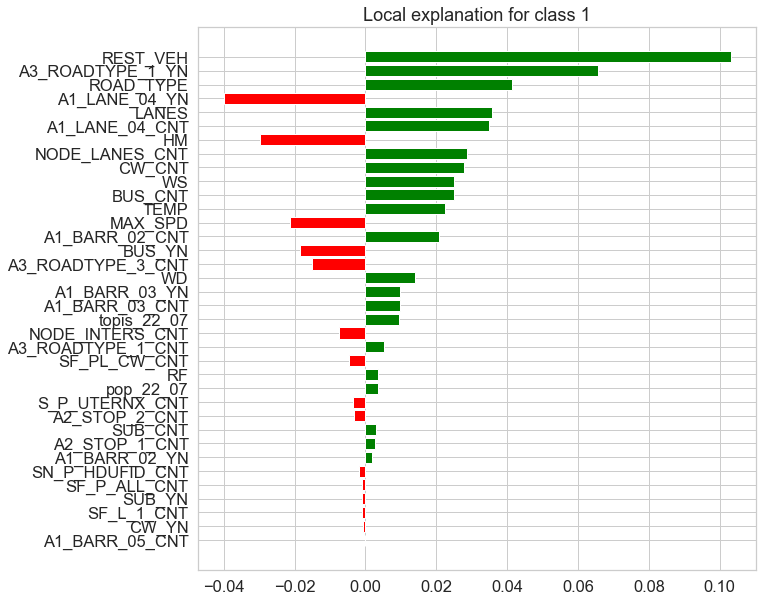

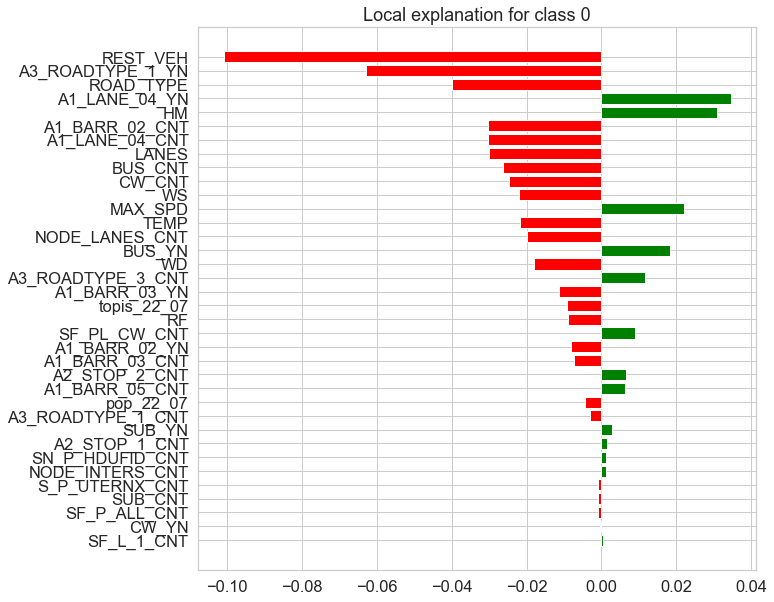

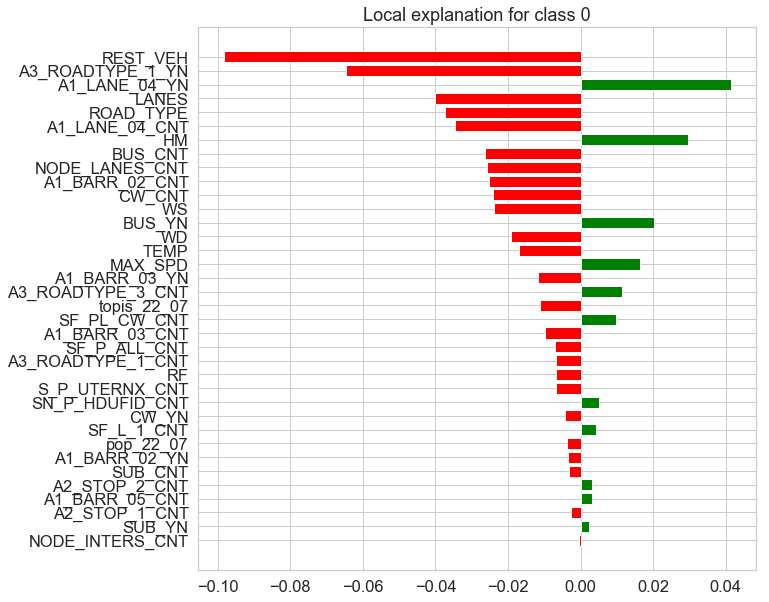

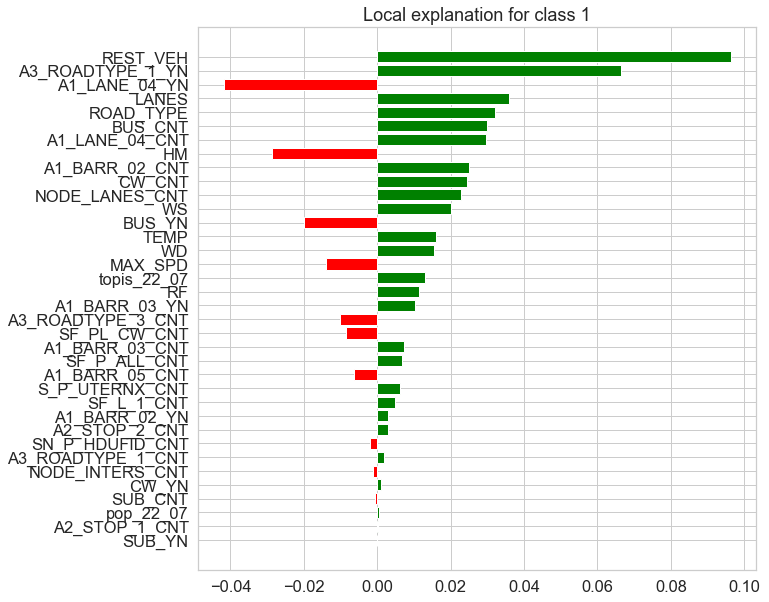

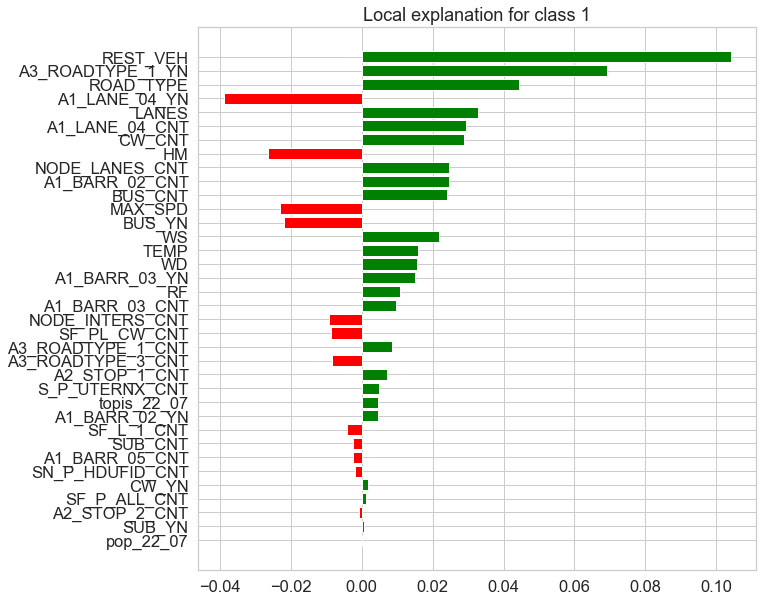

In [45]:
# Plot the 5 explanations
[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_obj.sp_explanations];
# Make it into a dataframe
W_pick=pd.DataFrame([dict(this.as_list(this.available_labels()[0])) for this in sp_obj.sp_explanations]).fillna(0)

In [46]:
W_pick['prediction'] = [this.available_labels()[0] for this in sp_obj.sp_explanations]
 
# Making a dataframe of all the explanations of sampled points
W=pd.DataFrame([dict(this.as_list(this.available_labels()[0])) for this in sp_obj.explanations]).fillna(0)
W['prediction'] = [this.available_labels()[0] for this in sp_obj.explanations]

In [47]:
# Plotting the aggregate importances
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
np.abs(W.drop("prediction", axis=1)).mean(axis=0).sort_values(ascending=False).head(20).sort_values(ascending=True).iplot(kind="barh", color = 'blue')

In [48]:
#Aggregate importances split by classes
grped_coeff = W.groupby("prediction").mean()
 
grped_coeff = grped_coeff.T
grped_coeff["abs"] = np.abs(grped_coeff.iloc[:, 0])
grped_coeff.sort_values("abs", inplace=True, ascending=False)
grped_coeff.head(20).sort_values("abs", ascending=True).drop("abs", axis=1).iplot(
    kind="barh", bargap=0.5
) 

In [49]:
1

1